First thing you should do is carefully read the entire README.MD here https://github.com/fizyr/keras-retinanet

Let's download the safety images from an azure blob 

In [1]:
# Download and extract image files
! curl -O https://computervisionhack.blob.core.windows.net/challengefiles/safety_images.zip
! unzip -o safety_images.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  109M  100  109M    0     0  20.4M      0  0:00:05  0:00:05 --:--:-- 24.4M
Archive:  safety_images.zip
  inflating: safety_images/434140.jpg  
  inflating: safety_images/434502.jpg  
  inflating: safety_images/434922.jpg  
  inflating: safety_images/434947.jpg  
  inflating: safety_images/480835.jpg  
  inflating: safety_images/480836.jpg  
  inflating: safety_images/480837.jpg  
  inflating: safety_images/480839.JPG  
  inflating: safety_images/480840.jpg  
  inflating: safety_images/480863.jpg  
  inflating: safety_images/480864.jpg  
  inflating: safety_images/480869.jpg  
  inflating: safety_images/480884.jpg  
  inflating: safety_images/480894.jpg  
  inflating: safety_images/480910.jpg  
  inflating: safety_images/480942.jpg  
  inflating: safety_images/480979.jpg  
  inflating: safety_images/480980.jpg  
  inflating: sa

  inflating: safety_images/482998.JPG  
  inflating: safety_images/483029.JPG  
  inflating: safety_images/483037.jpg  
  inflating: safety_images/483051.JPG  
  inflating: safety_images/483064.jpg  
  inflating: safety_images/483065.JPG  
  inflating: safety_images/483077.JPG  
  inflating: safety_images/483085.jpg  
  inflating: safety_images/483148.JPG  
  inflating: safety_images/483153.JPG  
  inflating: safety_images/483160.jpg  
  inflating: safety_images/483190.JPG  
  inflating: safety_images/483200.jpg  
  inflating: safety_images/483245.JPG  
  inflating: safety_images/483267.jpg  
  inflating: safety_images/483269.jpg  
  inflating: safety_images/483270.jpg  
  inflating: safety_images/483274.jpg  
  inflating: safety_images/483277.jpg  
  inflating: safety_images/483285.jpg  
  inflating: safety_images/483295.JPG  
  inflating: safety_images/483303.JPG  
  inflating: safety_images/483304.JPG  
  inflating: safety_images/483326.JPG  
  inflating: safety_images/483327.JPG  


Write out some annotations in the format needed by keras_retinanet

Let's rename all the files to have lower case, to save our sanity

In [119]:
files = listdir('safety_images') 

for file in files:
    os.rename(
              os.path.join( 'safety_images', file ), 
              os.path.join( 'safety_images', file.lower() )
            )

Next thing is we need to use VoTT to annotate all of our images https://github.com/Microsoft/VoTT -- note that in order to get the annotations in the required format is no easy task. The best export option I found was tfPascal, which outputs a bunch of .XML files for each image. We used this code to extract out the annotations in the correct format;



In [167]:
from os import listdir
from pipe import *
from lxml import etree
from pathlib import Path
import xml.etree.ElementTree as ET
import re
from itertools import chain

# first goto the Annotations folder where the XML files are 

files = listdir() \
    | where( lambda f: f.endswith('.xml') ) \
    | select( lambda p: (p, Path(p).read_text() ) ) \
    | select( lambda s: ET.fromstring(s[1]).findall('object') \
             | select( lambda o: ( 
                        'safety_images/%s' % s[0].replace('.xml','.jpg'),
                        o.find('bndbox/xmin').text, 
                        o.find('bndbox/ymin').text,
                        o.find('bndbox/xmax').text,
                        o.find('bndbox/ymax').text,
                        o.find('name').text,
    ) ) | as_list ) \
    | as_list 

flattened = list(chain(*files)) \
    | select( lambda s: '%s,%s,%s,%s,%s,%s' % (s[0],s[1],s[2],s[3],s[4],s[5]) ) \
    | as_list()

flattened

[]

Take roughly the first half of the annotations and write them into a training file called annotations.csv

In [142]:
%%writefile annotations.csv
safety_images/434140.jpg,186,250,207,264,nohelmet
safety_images/434140.jpg,343,195,360,211,helmet
safety_images/434502.jpg,229,164,418,341,nohelmet
safety_images/434502.jpg,1169,629,1277,749,nohelmet
safety_images/434922.jpg,303,176,362,230,helmet
safety_images/434947.jpg,269,413,380,509,helmet
safety_images/480835.jpg,708,309,813,387,nohelmet
safety_images/480836.jpg,1358,426,1476,501,nohelmet
safety_images/480839.jpg,986,1126,1234,1299,nohelmet
safety_images/480864.jpg,303,138,345,168,nohelmet
safety_images/480869.jpg,211,244,238,275,nohelmet
safety_images/480884.jpg,280,435,318,479,nohelmet
safety_images/480884.jpg,413,453,449,481,nohelmet
safety_images/480894.jpg,218,298,268,338,nohelmet
safety_images/480910.jpg,504,843,543,884,nohelmet
safety_images/480942.jpg,100,119,1748,1180,nohelmet
safety_images/480979.jpg,1073,1415,1351,1750,nohelmet
safety_images/480980.jpg,2184,568,2342,715,helmet
safety_images/480982.jpg,1508,1369,1588,1463,helmet
safety_images/480982.jpg,1307,1424,1371,1502,helmet
safety_images/480986.jpg,873,1286,1133,1489,helmet
safety_images/480988.jpg,632,1194,797,1334,helmet
safety_images/480998.jpg,1219,408,1633,720,helmet
safety_images/481003.jpg,1417,437,1612,639,nohelmet
safety_images/481006.jpg,1091,1460,1369,1686,nohelmet
safety_images/481007.jpg,373,189,443,243,nohelmet
safety_images/481012.jpg,667,1284,979,1536,helmet
safety_images/481017.jpg,854,728,1086,877,helmet
safety_images/481018.jpg,955,531,1142,687,nohelmet
safety_images/481019.jpg,139,166,208,209,helmet
safety_images/481022.jpg,119,89,226,156,nohelmet
safety_images/481022.jpg,239,144,294,191,nohelmet
safety_images/481022.jpg,389,101,444,153,nohelmet
safety_images/481023.jpg,19,250,122,330,nohelmet
safety_images/481025.jpg,112,95,597,367,nohelmet
safety_images/481045.jpg,1000,779,1545,1186,nohelmet
safety_images/481064.jpg,496,156,635,288,nohelmet
safety_images/481068.jpg,392,261,488,354,helmet
safety_images/481085.jpg,331,270,395,349,nohelmet
safety_images/481090.jpg,562,163,716,294,nohelmet
safety_images/481095.jpg,1153,443,1378,645,nohelmet
safety_images/481098.jpg,363,121,520,296,nohelmet
safety_images/481098.jpg,536,265,638,359,nohelmet
safety_images/481098.jpg,652,211,761,295,nohelmet
safety_images/481098.jpg,830,194,925,280,nohelmet
safety_images/481098.jpg,912,481,1018,586,nohelmet
safety_images/481098.jpg,980,180,1077,248,nohelmet
safety_images/481098.jpg,1225,167,1346,281,nohelmet
safety_images/481099.jpg,513,713,594,781,nohelmet
safety_images/481099.jpg,633,709,793,829,nohelmet
safety_images/481123.jpg,1189,480,1305,565,nohelmet
safety_images/481123.jpg,1360,450,1471,542,nohelmet
safety_images/481126.jpg,868,503,1037,614,nohelmet
safety_images/481127.jpg,695,257,905,399,nohelmet
safety_images/481127.jpg,937,336,1095,450,nohelmet
safety_images/481127.jpg,1390,399,1567,501,nohelmet
safety_images/481136.jpg,1187,1397,1327,1533,helmet
safety_images/481143.jpg,622,217,1400,698,nohelmet
safety_images/481144.jpg,507,361,546,396,nohelmet
safety_images/481146.jpg,397,251,495,339,helmet
safety_images/481171.jpg,456,814,746,1084,helmet
safety_images/481216.jpg,1331,187,1441,311,nohelmet
safety_images/481220.jpg,69,41,251,200,nohelmet
safety_images/481231.jpg,670,598,815,736,nohelmet
safety_images/481252.jpg,107,183,365,341,nohelmet
safety_images/481254.jpg,318,319,443,472,nohelmet
safety_images/481254.jpg,790,120,890,238,nohelmet
safety_images/481258.jpg,290,157,312,179,nohelmet
safety_images/481258.jpg,317,174,345,195,nohelmet
safety_images/481263.jpg,1321,515,1879,946,helmet
safety_images/481267.jpg,1575,92,1866,303,helmet
safety_images/481284.jpg,1283,2190,1415,2318,nohelmet
safety_images/481295.jpg,182,181,504,360,nohelmet
safety_images/481317.jpg,769,460,890,597,nohelmet
safety_images/481323.jpg,754,367,815,415,helmet
safety_images/481332.jpg,1043,1686,1640,2091,nohelmet
safety_images/481332.jpg,1670,1689,2091,2136,nohelmet
safety_images/481340.jpg,896,1269,1550,1622,nohelmet
safety_images/481350.jpg,1248,678,1504,904,helmet
safety_images/481350.jpg,1476,999,1724,1301,helmet
safety_images/481350.jpg,1685,546,1939,754,nohelmet
safety_images/481352.jpg,979,1697,1257,1915,helmet
safety_images/481353.jpg,888,604,1133,867,helmet
safety_images/481356.jpg,1073,0,2170,796,helmet
safety_images/481359.jpg,1840,856,2384,1163,nohelmet
safety_images/481371.jpg,267,443,317,487,helmet
safety_images/481372.jpg,371,259,442,308,helmet
safety_images/481383.jpg,627,694,725,784,nohelmet
safety_images/481383.jpg,1412,743,1529,831,nohelmet
safety_images/481387.jpg,1369,674,1480,781,nohelmet
safety_images/481397.jpg,934,589,990,639,nohelmet
safety_images/481405.jpg,402,70,499,151,nohelmet
safety_images/481420.jpg,897,802,1056,1002,nohelmet
safety_images/481420.jpg,1308,708,1411,816,nohelmet
safety_images/481421.jpg,546,563,875,860,nohelmet
safety_images/481427.jpg,574,1245,819,1455,nohelmet
safety_images/481429.jpg,277,652,941,1154,helmet
safety_images/481433.jpg,1336,598,1503,762,helmet
safety_images/481434.jpg,268,544,606,801,nohelmet
safety_images/481434.jpg,958,632,1134,825,nohelmet
safety_images/481443.jpg,1411,1288,1606,1455,helmet
safety_images/481446.jpg,1188,1743,1307,1871,helmet
safety_images/481451.jpg,133,251,182,276,nohelmet
safety_images/481452.jpg,329,238,362,258,nohelmet
safety_images/481457.jpg,1537,966,1800,1166,nohelmet
safety_images/481470.jpg,1696,443,2070,709,nohelmet
safety_images/481502.jpg,540,629,584,664,nohelmet
safety_images/481517.jpg,549,251,597,302,helmet
safety_images/481569.jpg,540,1137,696,1235,nohelmet
safety_images/481574.jpg,591,443,703,551,nohelmet
safety_images/481574.jpg,971,319,1252,516,nohelmet
safety_images/481580.jpg,1187,204,1279,330,helmet
safety_images/481586.jpg,967,610,1114,732,helmet
safety_images/481587.jpg,1020,629,1125,747,helmet
safety_images/481588.jpg,662,1013,833,1119,helmet
safety_images/481593.jpg,742,1149,943,1293,helmet
safety_images/481599.jpg,343,653,456,751,helmet
safety_images/481619.jpg,925,942,1091,1067,helmet
safety_images/481639.jpg,1646,430,1799,570,nohelmet
safety_images/481639.jpg,1921,393,2056,515,nohelmet
safety_images/481650.jpg,525,903,977,1264,nohelmet
safety_images/481692.jpg,1415,1006,1793,1277,helmet
safety_images/481706.jpg,784,483,806,506,nohelmet
safety_images/481754.jpg,1417,494,1874,855,helmet
safety_images/481754.jpg,1772,643,2229,928,helmet
safety_images/481754.jpg,2308,193,2634,513,helmet
safety_images/481754.jpg,1,1486,242,1834,helmet
safety_images/481756.jpg,1213,241,2019,824,helmet
safety_images/481758.jpg,961,756,1293,1043,nohelmet
safety_images/481777.jpg,554,1050,1324,1592,helmet
safety_images/481777.jpg,991,646,1386,993,helmet
safety_images/481782.jpg,862,1907,1054,2118,nohelmet
safety_images/481962.jpg,415,570,480,636,nohelmet
safety_images/481976.jpg,327,122,403,176,nohelmet
safety_images/482030.jpg,743,167,824,245,nohelmet
safety_images/482047.jpg,108,76,171,125,nohelmet
safety_images/482047.jpg,189,72,236,123,nohelmet
safety_images/482128.jpg,1657,362,1953,619,nohelmet
safety_images/482133.jpg,2660,1226,2848,1429,nohelmet
safety_images/482134.jpg,1152,2136,1264,2335,helmet
safety_images/482135.jpg,301,0,1349,591,helmet
safety_images/482181.jpg,1300,345,1589,602,helmet
safety_images/482199.jpg,199,53,233,92,helmet
safety_images/482199.jpg,116,205,144,235,helmet
safety_images/482216.jpg,1454,766,1640,949,helmet
safety_images/482223.jpg,445,149,494,207,nohelmet
safety_images/482226.jpg,193,547,232,580,nohelmet
safety_images/482271.jpg,2505,628,2680,743,nohelmet
safety_images/482308.jpg,509,242,716,467,helmet
safety_images/482339.jpg,897,435,1159,647,nohelmet
safety_images/482359.jpg,128,26,294,183,nohelmet
safety_images/482360.jpg,395,154,499,277,nohelmet
safety_images/482504.jpg,240,343,347,444,nohelmet
safety_images/482536.jpg,903,622,1010,747,helmet
safety_images/482536.jpg,1088,2150,1232,2300,helmet
safety_images/482583.jpg,169,306,211,350,nohelmet
safety_images/482585.jpg,391,252,476,332,nohelmet
safety_images/482585.jpg,624,202,694,269,nohelmet
safety_images/482585.jpg,747,217,808,287,helmet
safety_images/482623.jpg,244,121,309,198,nohelmet
safety_images/482623.jpg,322,185,384,234,nohelmet
safety_images/482696.jpg,769,982,876,1115,helmet
safety_images/482698.jpg,225,483,429,655,helmet
safety_images/482698.jpg,429,469,630,655,helmet
safety_images/482698.jpg,1200,462,1409,629,helmet
safety_images/482698.jpg,1363,355,1655,595,helmet
safety_images/482714.jpg,1129,1385,1279,1536,helmet
safety_images/482725.jpg,73,132,156,197,helmet
safety_images/482725.jpg,199,153,287,201,helmet
safety_images/482725.jpg,327,279,387,332,helmet
safety_images/482725.jpg,410,176,467,224,helmet
safety_images/482725.jpg,484,130,549,180,helmet
safety_images/482726.jpg,176,183,300,290,helmet
safety_images/482753.jpg,214,402,256,438,nohelmet
safety_images/482754.jpg,319,368,355,401,nohelmet
safety_images/482767.jpg,693,214,1061,619,helmet
safety_images/482777.jpg,1070,659,1143,722,nohelmet
safety_images/482777.jpg,1383,719,1446,812,nohelmet
safety_images/482778.jpg,509,268,559,323,nohelmet
safety_images/482786.jpg,702,823,1044,1124,nohelmet
safety_images/482804.jpg,652,940,793,1120,nohelmet
safety_images/482810.jpg,441,450,701,679,helmet
safety_images/482812.jpg,267,547,907,995,helmet
safety_images/482824.jpg,566,676,666,762,helmet
safety_images/482827.jpg,1321,228,2587,1166,nohelmet
safety_images/482875.jpg,261,96,365,195,helmet
safety_images/482875.jpg,373,119,437,194,helmet

Overwriting annotations.csv


Write out a class mapping file

In [6]:
%%writefile annotations_mapping.csv
helmet,0
nohelmet,1

Writing annotations_mapping.csv


First thing to do is on the *Linux* DSVM (note that by default the Windows DSVM doesn't have gcc installed, so keras-retinanet won't function without installing Cygwin); 

* Clone this repo https://github.com/fizyr/keras-retinanet.git
* Goto the keras-retinanet folder and execute this `pip install . --user`
* Download the latest resnet50 coco weights `wget https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5`
* Execute `retinanet-train --epochs=15 --steps=1000 --freeze-backbone --weights resnet50_coco_best_v2.1.0.h5 csv ./annotations.csv ./annotations_mapping.csv` This will take about 30 minutes on a Tesla V100 GPU. If you are tight on time 3-4 epochs still works well enough
* Next you need to convert the training model to an inference model, execute `retinanet-convert-model ./snapshots/resnet50_csv_15.h5 ./helmets-3.h5`


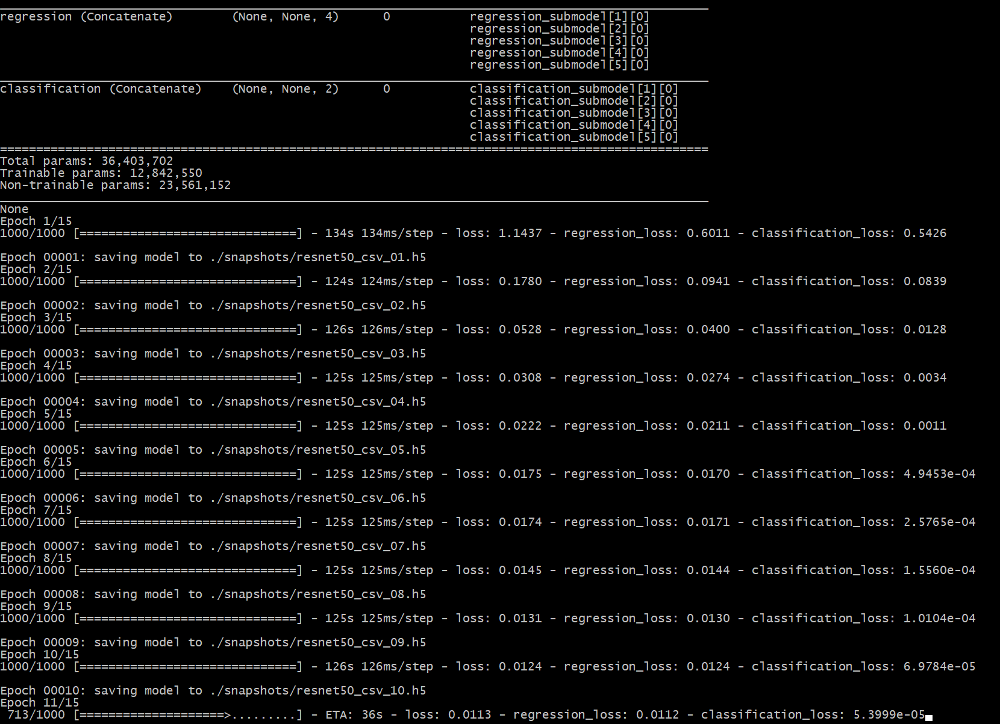



Some initialization code

In [1]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

# set tf backend to allow memory to grow, instead of claiming everything
import tensorflow as tf

def get_session():
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    return tf.Session(config=config)

# use this environment flag to change which GPU to use
#os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# set the modified tf session as backend in keras
keras.backend.tensorflow_backend.set_session(get_session())

/anaconda/envs/py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Load in the model which we have created, and we specify that we used the resnet 50 backbone. Note this is AFTER we convert the training model to an inference model

In [162]:
model_path = os.path.join('helmets-3.h5')

# load retinanet model
model = models.load_model(model_path, backbone_name='resnet50')

/anaconda/envs/py35/lib/python3.5/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Create a mapping from our label IDs to class names

In [151]:
label_map = { 1: 'NOTHELMET', 0: 'HELMET' }

Our main predict function i.e. use our model to predict the scores, labels and bounding boxes then plot

In [165]:
def predictImage(path):

    # load image
    image = read_image_bgr(path)

    #safety_images/480986.jpg

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    start = time.time()
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
    print("processing time: ", time.time() - start)

    # correct for image scale
    boxes /= scale

    # visualize detections
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        # scores are sorted so we can break
        if score < 0.6:
            break

        color = label_color(label)

        b = box.astype(int)
        draw_box(draw, b, color=color)

        caption = "{} {:.3f}".format(label_map[label], score)
        draw_caption(draw, b, caption)

    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()

Let's plot an example, seems to work well!

processing time:  0.05384206771850586


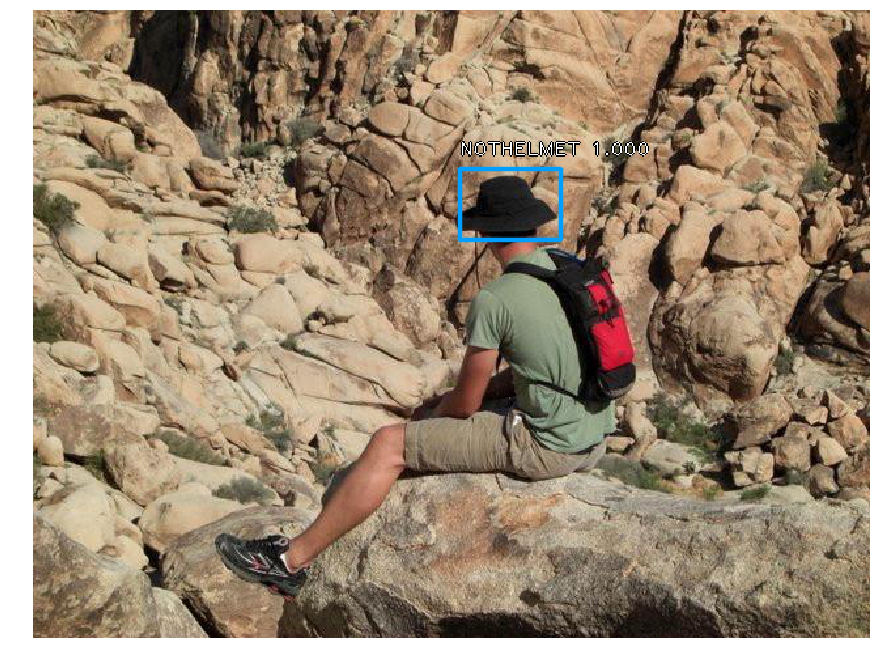

In [161]:
predictImage('safety_images/481976.jpg')

Let's test on some images which we *didn't* train on

In [166]:
import re
from os import listdir
from pipe import *

# which images have we trained on?
with open('annotations.csv', 'r') as f:
    annotations = f.readlines() \
        | select( lambda l: ( re.search('\d+\.JPG(?i)', l).group(), 1 ) ) \
        | as_dict

# which images from safety_images are OK to test on i.e. we didn't train on them?
test_images = listdir('safety_images') \
    | select( lambda l: re.search('\d+\.JPG(?i)', l).group() ) \
    | where( lambda f: f not in annotations ) \
    | as_list 


Now let's choose 10 of those images at random and predict them

processing time:  0.05062699317932129


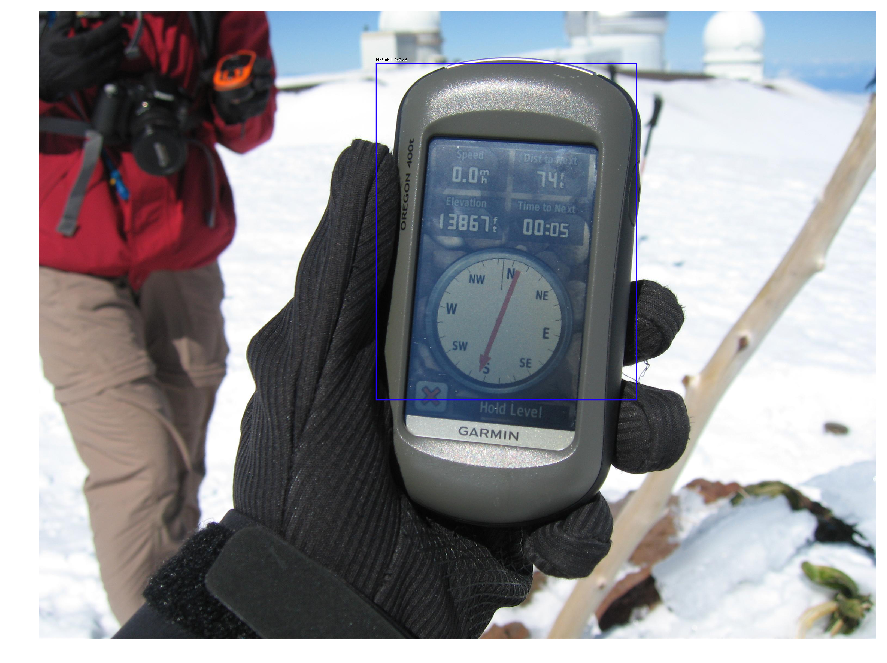

processing time:  0.049530744552612305


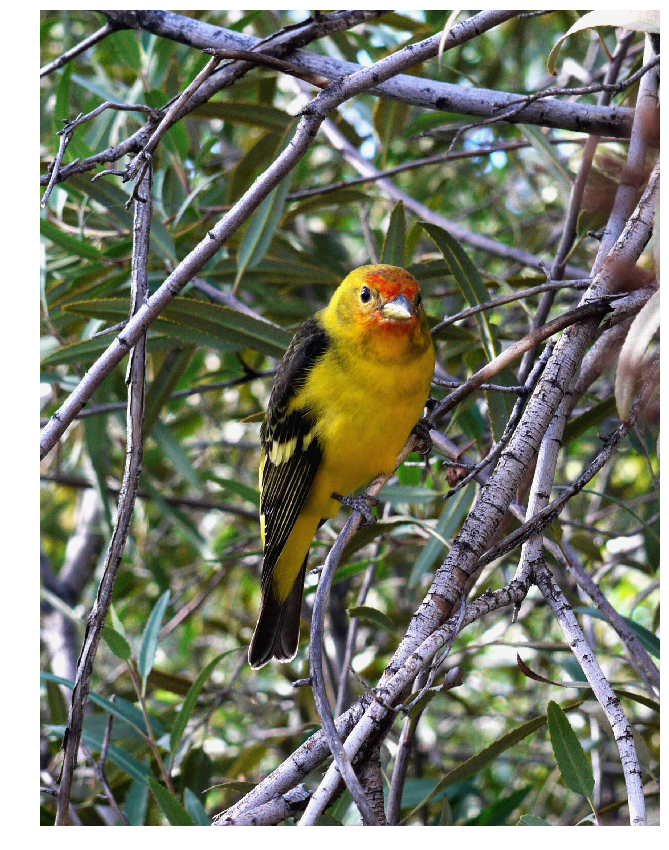

processing time:  0.05330777168273926


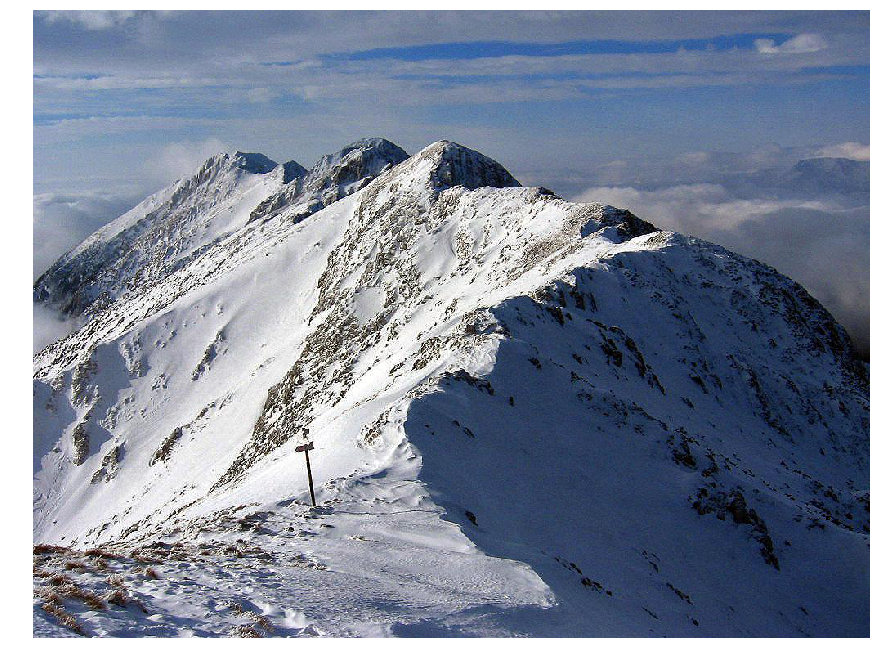

processing time:  0.053940534591674805


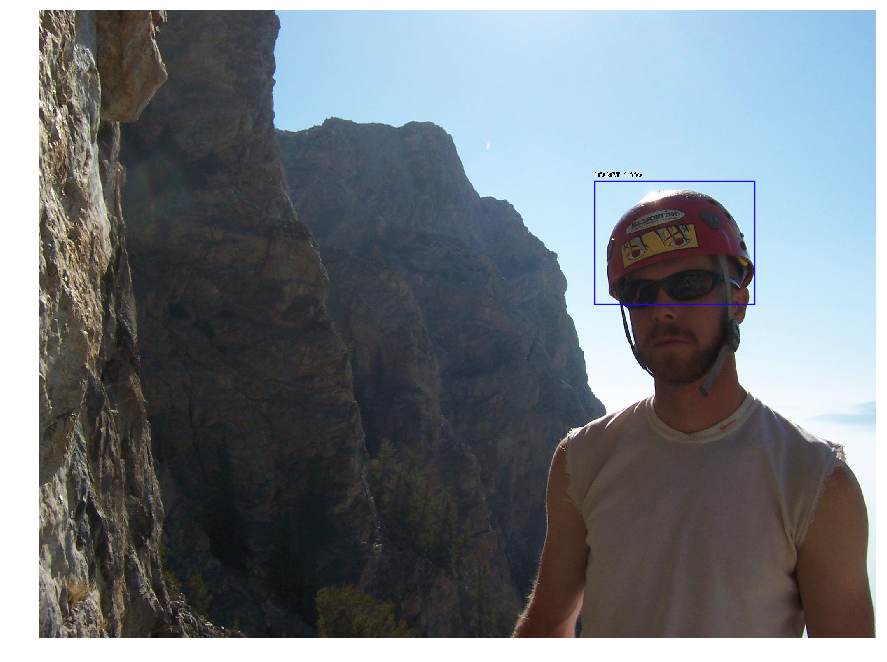

processing time:  0.059552669525146484


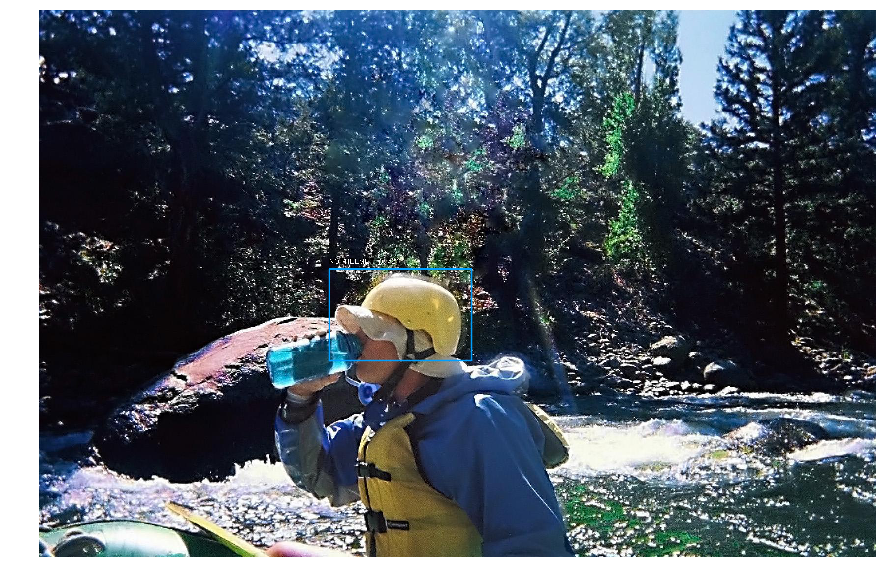

processing time:  0.053034067153930664


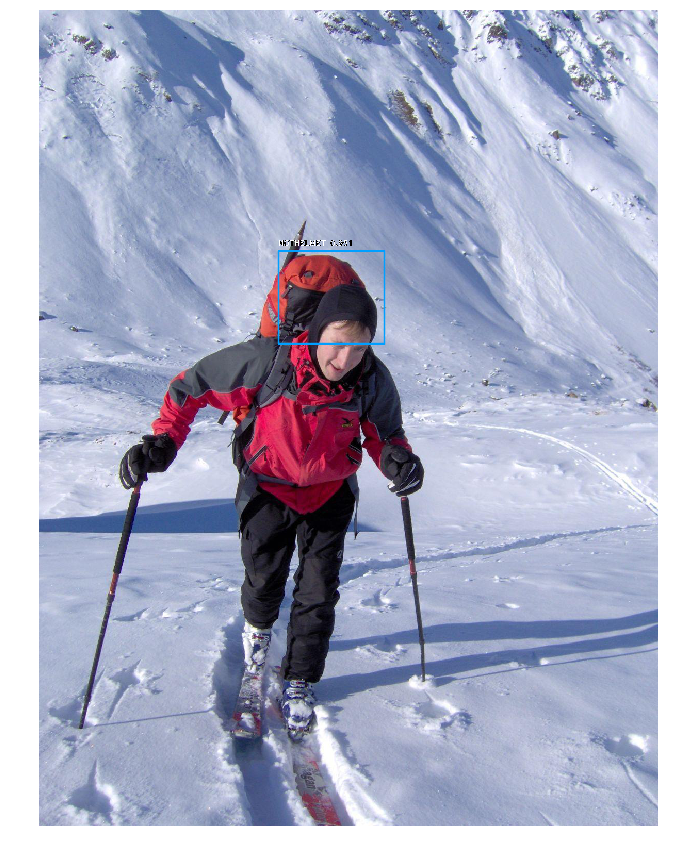

processing time:  0.05345892906188965


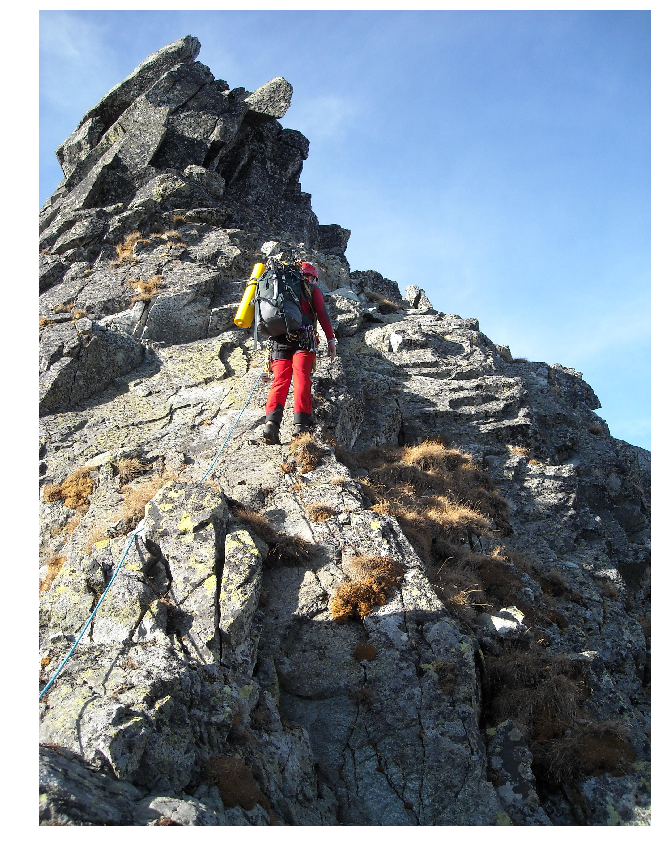

processing time:  0.05379819869995117


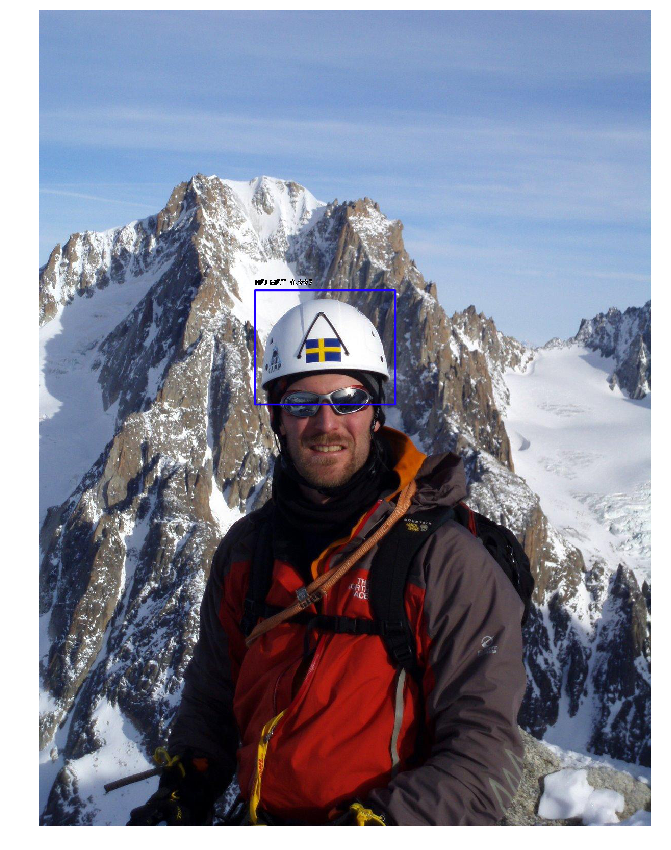

processing time:  0.053698062896728516


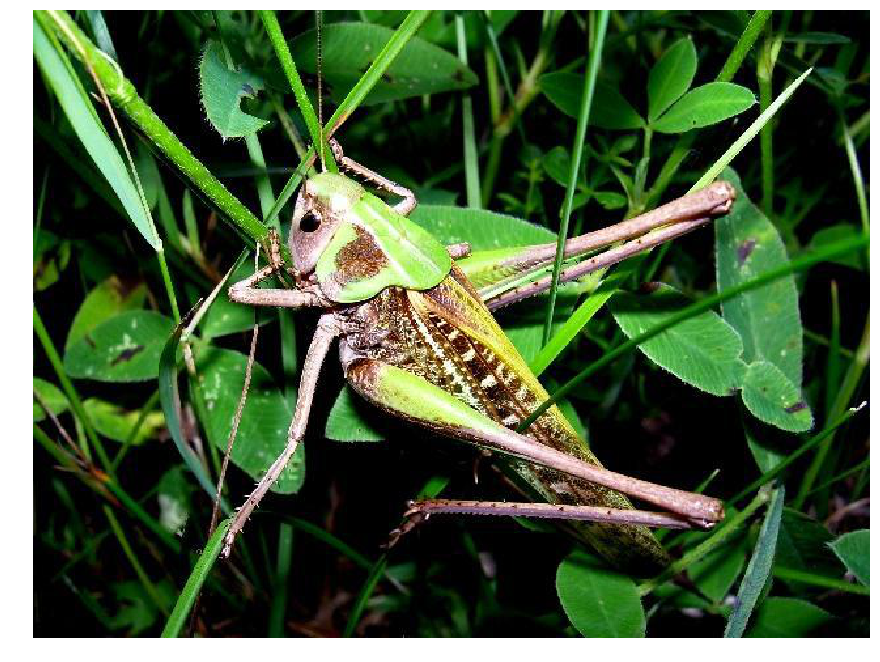

processing time:  0.053514719009399414


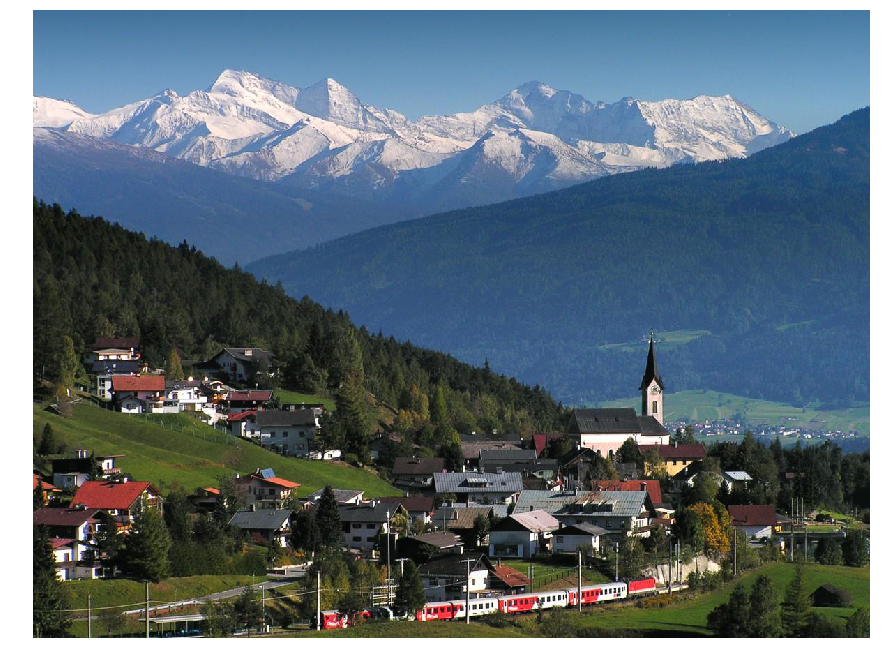

In [169]:
# choose 10 randomly and predict them
import random

@Pipe
def pshuffle(l):
    random.shuffle(l)
    for i in l: yield i

test_batch = test_images \
    | pshuffle \
    | take(10) \
    | select( lambda p: os.path.join('./safety_images/',p) ) \
    | as_list

for image in test_batch:
    predictImage(image)

It seems to work reasonably well. But the schoolboy error here is to rely on visual inspection and not evaluate our model on data which we didn't test on!

Let's be more rigourous and calculate the mAP score for the other images. The challenge stipultaes that we need to be over 0.6 mAP

Let's write out a new test file containing all images we didnt train on, this is the other half of the output from the code we wrote earlier

In [143]:
%%writefile annotations_test.csv
safety_images/482879.jpg,368,558,443,617,helmet
safety_images/482879.jpg,577,611,642,688,helmet
safety_images/482882.jpg,1723,751,1960,981,helmet
safety_images/482928.jpg,41,146,208,271,helmet
safety_images/482945.jpg,1637,957,1787,1086,nohelmet
safety_images/482950.jpg,176,4,555,217,nohelmet
safety_images/482980.jpg,967,1092,1392,1468,nohelmet
safety_images/483029.jpg,1154,485,1439,779,helmet
safety_images/483051.jpg,40,256,61,284,nohelmet
safety_images/483051.jpg,98,316,123,343,nohelmet
safety_images/483051.jpg,210,245,242,279,nohelmet
safety_images/483051.jpg,544,229,583,273,nohelmet
safety_images/483064.jpg,417,77,526,173,helmet
safety_images/483065.jpg,427,555,701,833,helmet
safety_images/483077.jpg,517,311,787,492,nohelmet
safety_images/483085.jpg,1538,112,2384,752,helmet
safety_images/483153.jpg,1140,1418,1431,1759,nohelmet
safety_images/483153.jpg,1667,1412,1967,1669,nohelmet
safety_images/483153.jpg,2191,1526,2464,1720,nohelmet
safety_images/483160.jpg,631,517,907,709,helmet
safety_images/483190.jpg,723,747,929,883,helmet
safety_images/483200.jpg,284,142,368,217,helmet
safety_images/483200.jpg,520,318,557,358,helmet
safety_images/483245.jpg,853,399,1438,743,helmet
safety_images/483245.jpg,1543,64,2458,765,nohelmet
safety_images/483269.jpg,153,184,189,212,helmet
safety_images/483270.jpg,181,99,255,164,helmet
safety_images/483285.jpg,225,87,333,240,helmet
safety_images/483285.jpg,293,39,490,192,helmet
safety_images/483295.jpg,1325,415,1880,754,helmet
safety_images/483303.jpg,922,901,1091,998,nohelmet
safety_images/483326.jpg,660,509,1405,1020,helmet
safety_images/483327.jpg,779,270,1071,599,helmet
safety_images/483366.jpg,564,306,794,506,helmet
safety_images/483367.jpg,420,578,589,702,helmet
safety_images/483382.jpg,716,431,798,509,helmet
safety_images/483426.jpg,366,672,693,940,helmet
safety_images/483448.jpg,632,236,854,491,helmet
safety_images/483454.jpg,342,192,440,307,nohelmet
safety_images/483463.jpg,1504,344,1792,576,nohelmet
safety_images/483510.jpg,627,433,960,711,helmet
safety_images/483510.jpg,1112,450,1390,675,helmet
safety_images/483510.jpg,1781,232,2054,485,helmet
safety_images/483510.jpg,2194,130,2499,322,helmet
safety_images/483516.jpg,320,104,484,222,nohelmet
safety_images/483522.jpg,1679,322,1853,584,nohelmet
safety_images/483536.jpg,460,497,671,735,nohelmet
safety_images/483560.jpg,1841,334,2181,567,nohelmet
safety_images/483637.jpg,1998,1202,2206,1399,helmet
safety_images/483794.jpg,193,169,474,437,nohelmet

Writing annotations_test.csv


Then let's execute `retinanet-evaluate csv annotations_test.csv annotations_mapping.csv ./helmets-3.h5`

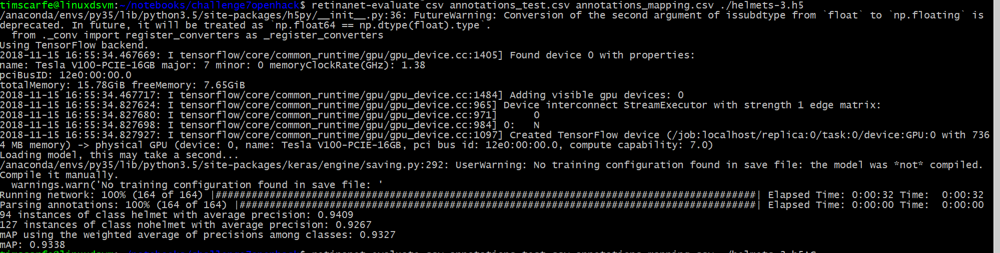

You should get a mAP score of `.9+`